In [2]:
from keras.optimizers import Adam
from keras.callbacks import TensorBoard, CSVLogger, ModelCheckpoint
import tensorflow as tf 
tf.compat.v1.disable_eager_execution()
import numpy as np
import datetime
import os

In [3]:
!pip install sk-video
!pip install scipy
!pip install mediapipe

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
import numpy as np

class Align(object):
    def __init__(self, absolute_max_string_len=32, label_func=None):
        self.label_func = label_func
        self.absolute_max_string_len = absolute_max_string_len

    def from_file(self, path):
        with open(path, 'r') as f:
            lines = f.readlines()
        align = [(int(y[0])/1000, int(y[1])/1000, y[2]) for y in [x.strip().split(" ") for x in lines]]
        self.build(align)
        return self

    def from_array(self, align):
        self.build(align)
        return self

    def build(self, align):
        self.align = self.strip(align, ['sp','sil'])
        self.sentence = self.get_sentence(align)
        self.label = self.get_label(self.sentence)
        self.padded_label = self.get_padded_label(self.label)

    def strip(self, align, items):
        return [sub for sub in align if sub[2] not in items]

    def get_sentence(self, align):
        return " ".join([y[-1] for y in align if y[-1] not in ['sp', 'sil']])

    def get_label(self, sentence):
        return self.label_func(sentence)

    def get_padded_label(self, label):
        padding = np.ones((self.absolute_max_string_len-len(label))) * -1
        return np.concatenate((np.array(label), padding), axis=0)

    @property
    def word_length(self):
        return len(self.sentence.split(" "))

    @property
    def sentence_length(self):
        return len(self.sentence)

    @property
    def label_length(self):
        return len(self.label)

In [5]:
import os
import numpy as np
from keras import backend as K
from scipy import ndimage
import skvideo.io
import dlib



import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
import  cv2
import os

from keras import backend as K
class Video(object):
    def __init__(self):
        self.mp_holistic = mp.solutions.holistic
        self.holistic_model = self.mp_holistic.Holistic(
        min_detection_confidence=0.5,
        min_tracking_confidence=0.5
        )

  
    def getLipLandmarks(self,results):
        index=0
        lips_x=[]
        lips_y=[]
        for lip_landmarks in results.landmark:
            #print("x: ",lip_landmarks.x)
            #print("y: ",lip_landmarks.y)
            if(index ==  61 or index == 76 or index == 62 or index == 146 or index == 77 or index == 96  
                  or index == 95 or index == 191 or index == 183 or index == 184 or index == 185 or index == 78 
                  or index == 306 or index == 292 or index == 291 or index == 308 or index == 324 or index == 415
                  or index == 407 or index == 408 or index == 409 or index == 325 or index == 307 or index == 375
                  or index == 40 or index == 74 or index == 42 or index == 80 or index == 88 or index == 89 or index == 90
                  or index == 91 or index == 39 or index == 73 or index == 41 or index == 81 or index == 178 or index == 179
                  or index == 180 or index == 181 or index == 37 or index == 72 or index == 38 or index == 82 or index == 87
                  or index == 86 or index == 85 or index == 84 or index == 0 or index == 11 or index == 12 or index == 13 
                  or index == 14 or index == 15 or index == 16 or index == 17 or index == 267 or index == 302 or index == 268 
                   or index == 312 or index == 317 or index == 316 or index == 315 or index == 314 or index == 269 or index == 303 
                    or index == 271 or index == 311 or index == 402 or index == 403 or index == 404 or index == 405 or index == 270
                  or index == 304 or index == 272 or index == 310 or index == 318 or index == 319 or index == 320 or index == 321):

                    # Putting array of landmark attributes in test (Exluding res.visibility)
                    lips_x.append(lip_landmarks.x)
                    lips_y.append(lip_landmarks.y)


            index+=1 # (Update)To keep track
        return lips_x,lips_y 
    def ApplyModel(self,ImagePath):
        frame = ImagePath

        #frame = cv2.resize(frame, (800, 600))

        #image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        results = self.holistic_model.process(frame)
        lips_x,lips_y=self.getLipLandmarks(results.face_landmarks)

        MOUTH_WIDTH = 100
        MOUTH_HEIGHT = 50
        HORIZONTAL_PAD = 0.05
        VERTICAL_PAD = 0.05
        # Converting back the RGB image to BGR
        #image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

  

        # Unormalizing lip landmarks
        for i in range(len(lips_x)):
            lips_x[i]=int(lips_x[i]*frame.shape[1])
            lips_y[i]=int(lips_y[i]*frame.shape[0])
        
        #code to draw landmarks on lips
        for i in range(len(lips_x)):
            cv2.circle(frame, (lips_x[i],lips_y[i]), 1, (255, 0, 0), -1)
        #plt.imshow(frame)
        
        mouth_left = min(lips_x) * (1.0 - HORIZONTAL_PAD)
        mouth_right = max(lips_x) * (1.0 + HORIZONTAL_PAD)
        mouth_top = min(lips_y) * (1.0 - VERTICAL_PAD)
        mouth_bottom = max(lips_y)* (1.0 +  VERTICAL_PAD)
        
        crop_image = frame[ int(mouth_top):int(mouth_bottom),int(mouth_left):int(mouth_right)]
       
        newsize = (100, 50)
            
        resized_img=cv2.resize(crop_image, newsize)
        

        plt.title("Resultant Image");plt.axis('off');plt.imshow(resized_img);plt.show()
        return resized_img
   
    def from_frames(self, path):
        frames = self.get_video_frames(path)
        #frames_path = sorted([os.path.join(path, x) for x in os.listdir(path)])
        #frames = [ndimage.imread(frame_path) for frame_path in frames_path]
        self.handle_type(frames)
        return self

    def from_video(self, path):
        frames = self.get_video_frames(path)
        self.handle_type(frames)
        return self

    def from_array(self, frames):
        self.handle_type(frames)
        return self

    def handle_type(self, frames):
        self.process_frames_face(frames)
       

    def process_frames_face(self, frames):
      
        mouth_frames = self.get_frames_mouth(frames)
        self.face = np.array(frames)
        self.mouth = np.array(mouth_frames)
        self.set_data(mouth_frames)

    def process_frames_mouth(self, frames):
        self.face = np.array(frames)
        self.mouth = np.array(frames)
        self.set_data(frames)

    def get_frames_mouth(self,frames):
      fname=[]
      for i in range(len(frames)):
          #im_cv = cv2.imread(frames[i], cv2.IMREAD_COLOR)
                #im_rgb = cv2.cvtColor(im_cv, cv2.COLOR_BGR2RGB)
                #frame2=self.edit_module(im_rgb)
        cropped_img=self.ApplyModel(frames[i])
        fname.append(cropped_img)
      return fname    
                

    def get_video_frames(self, path):
        videogen = skvideo.io.vreader(path)
        frames = np.array([frame for frame in videogen])
        return frames

    def set_data(self, frames):
        data_frames = []
        for frame in frames:
            frame = frame.swapaxes(0,1) # swap width and height to form format W x H x C
            if len(frame.shape) < 3:
                frame = np.array([frame]).swapaxes(0,2).swapaxes(0,1) # Add grayscale channel
            data_frames.append(frame)
        frames_n = len(data_frames)
        data_frames = np.array(data_frames) # T x W x H x C
        if K.image_data_format() == 'channels_first':
            data_frames = np.rollaxis(data_frames, 3) # C x T x W x H
        self.data = data_frames
        self.length = frames_n
        

In [6]:
import glob
class datasetMaker:
  def __init__(self,videos_path,align_path,img_c,img_w,img_h,frames_n,max_length):
    self.path=videos_path
    self.align_path=align_path
    self.blank_label    = 27
    self.img_c          = img_c
    self.img_w          = img_w
    self.img_h          = img_h
    self.frames_n       = frames_n
    self.absolute_max_string_len = max_length
  
        
  def enumerate_videos(self, path):
        video_list = []
        print(path)
        #print("dishfisdfh")
        count=0
        for video_path in glob.glob(path):
            count+=1
            try:
                if os.path.isfile(video_path):
                    print(video_path)
                    video = Video().from_video(video_path)
                else:
                    #print("yrs")
                    video = Video().from_frames(video_path)
            except AttributeError as err:
                raise err
            except:
                print ("Error loading video: ")+video_path
                continue
            print("video shape: ",video.data.shape)
            if K.image_data_format() == 'channels_first' and video.data.shape != (self.img_c,self.frames_n,self.img_w,self.img_h):
                print ("Video ")+video_path+" has incorrect shape "+str(video.data.shape)+", must be "+str((self.img_c,self.frames_n,self.img_w,self.img_h))+""
                continue
            if K.image_data_format() != 'channels_first' and video.data.shape != (self.frames_n,self.img_w,self.img_h,self.img_c):
                print ("Video ")+video_path+" has incorrect shape "+str(video.data.shape)+", must be "+str((self.frames_n,self.img_w,self.img_h,self.img_c))+""
                continue
            video_list.append(video_path)
            if(count==20):
              break
        return video_list
  def get_align(self, _id):
        return self.align_hash[_id]
  def enumerate_align_hash(self, video_list):
        self.align_hash = {}
        for video_path in video_list:
            video_id = os.path.splitext(video_path)[0].split('/')[-1]
            align_path = os.path.join(self.align_path, video_id)+".align"
            self.align_hash[video_id] = Align(self.absolute_max_string_len, text_to_labels).from_file(align_path)
        return self.align_hash
  def get_batch(self, video_list, align_hash):
        X_data_path = video_list
        X_data = []
        Y_data = []
        label_length = []
        input_length = []
        source_str = []
        for path in X_data_path:
            #print("path: ",path)
            video = Video().from_video(path)
            temp=path.split('/')[-1]
            t=temp.split('.')
            #print("t: ",t)
            align =self.get_align(t[0])
            video_unpadded_length = video.length
            X_data.append(video.data)
            Y_data.append(align.padded_label)
            label_length.append(align.label_length) # CHANGED [A] -> A, CHECK!
            # input_length.append([video_unpadded_length - 2]) # 2 first frame discarded
            input_length.append(video.length) # Just use the video padded length to avoid CTC No path found error (v_len < a_len)
            source_str.append(align.sentence) # CHANGED [A] -> A, CHECK!

        source_str = np.array(source_str)
        label_length = np.array(label_length)
        input_length = np.array(input_length)
        Y_data = np.array(Y_data)
        X_data = np.array(X_data).astype(np.float32) / 255 # Normalize image data to [0,1], TODO: mean normalization over training data

        inputs = {'the_input': X_data,
                  'the_labels': Y_data,
                  'input_length': input_length,
                  'label_length': label_length,
                  'source_str': source_str  # used for visualization only
                  }
        outputs = {'ctc': np.zeros([len(video_list)])}  # dummy data for dummy loss function

        return (inputs, outputs)


drive/MyDrive/datasets/s3/mpg_6000/*
drive/MyDrive/datasets/s3/mpg_6000/pbbc4p.mpg


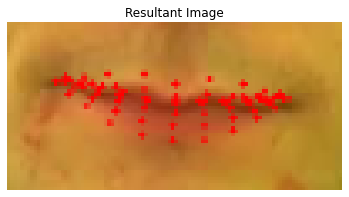

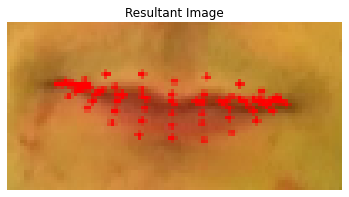

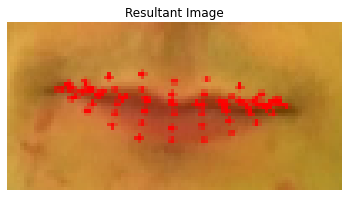

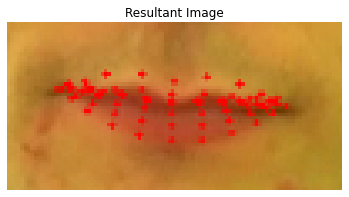

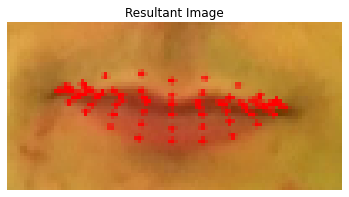

...

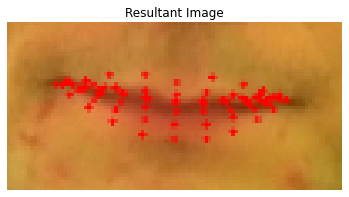

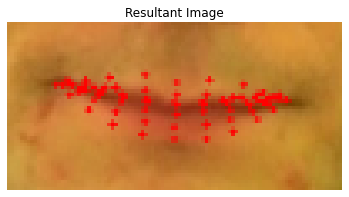

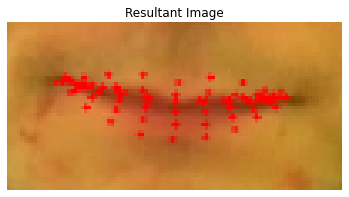

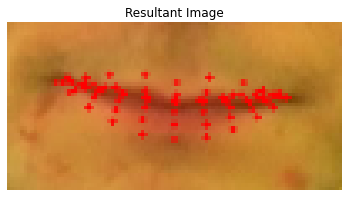

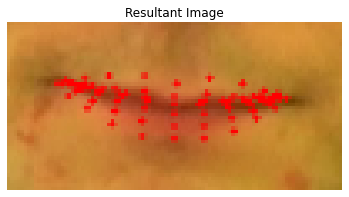

video shape:  (75, 100, 50, 3)
drive/MyDrive/datasets/s3/mpg_6000/sban2p.mpg


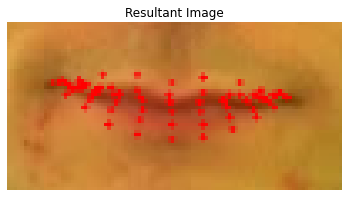

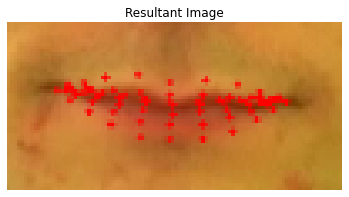

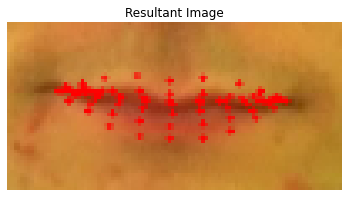

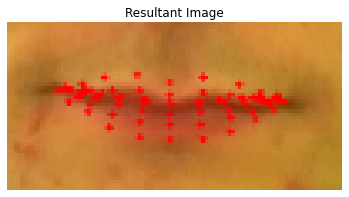

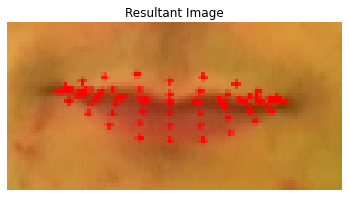

...

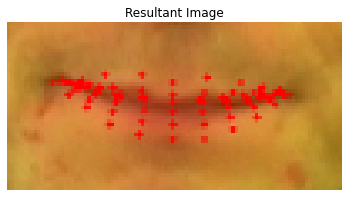

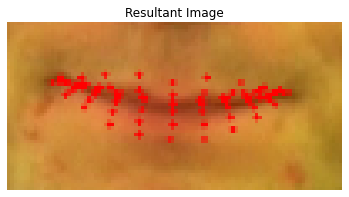

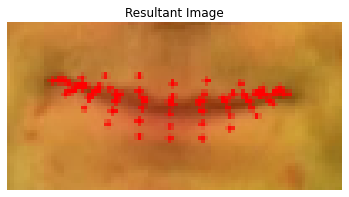

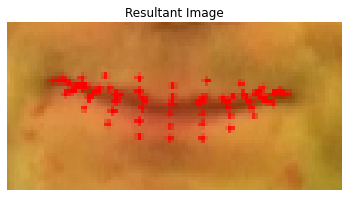

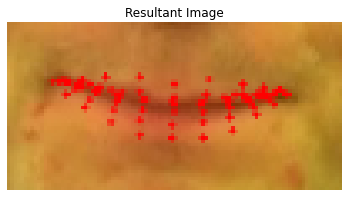

video shape:  (75, 100, 50, 3)
drive/MyDrive/datasets/s3/mpg_6000/lrik3a.mpg


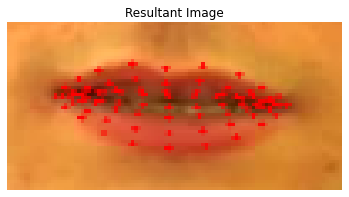

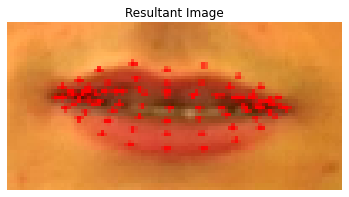

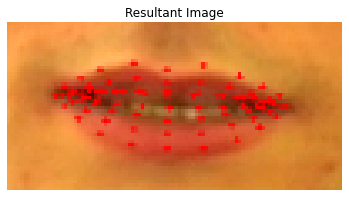

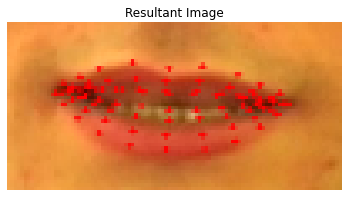

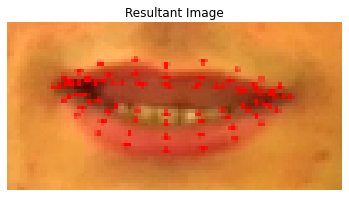

...

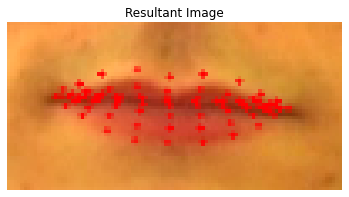

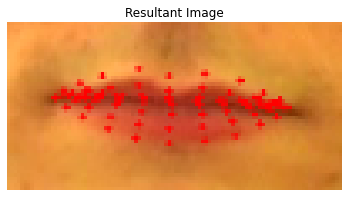

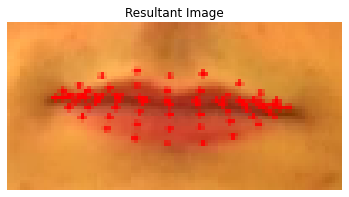

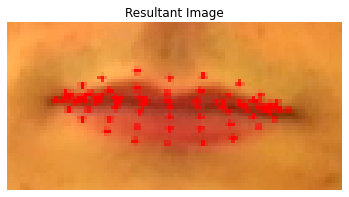

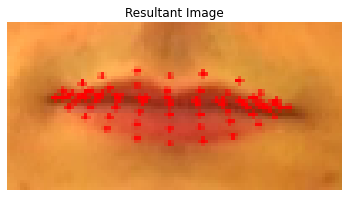

video shape:  (75, 100, 50, 3)
drive/MyDrive/datasets/s3/mpg_6000/prai9s.mpg


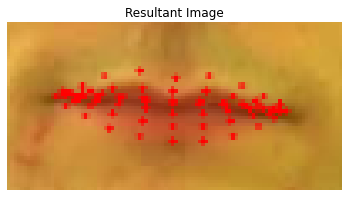

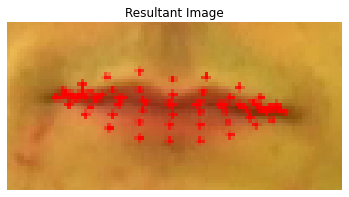

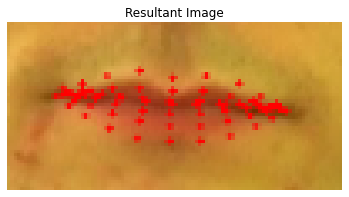

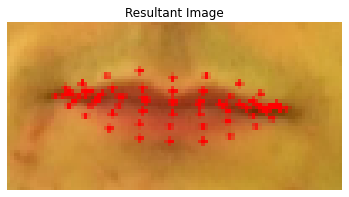

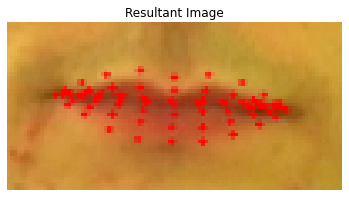

...

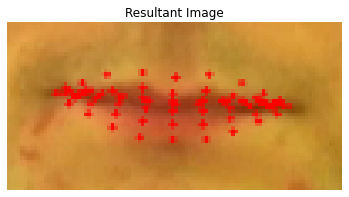

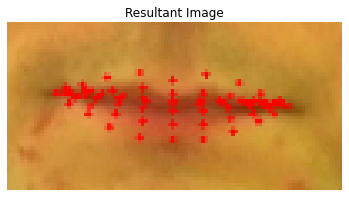

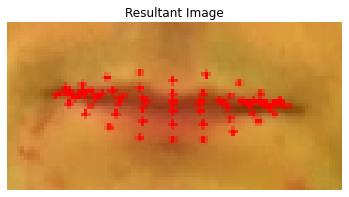

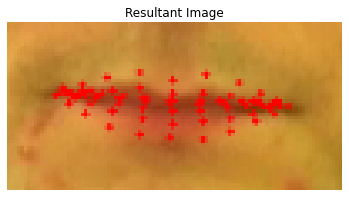

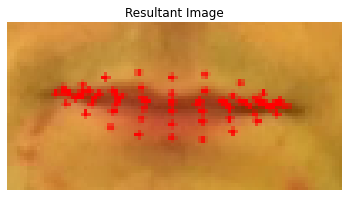

video shape:  (75, 100, 50, 3)
drive/MyDrive/datasets/s3/mpg_6000/bwag4p.mpg


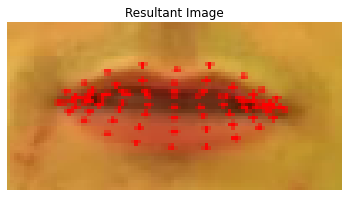

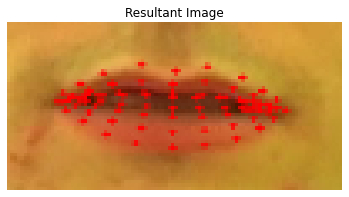

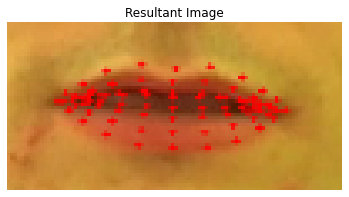

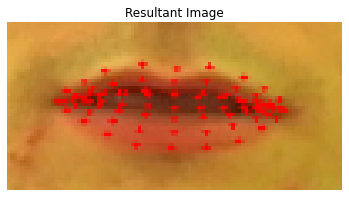

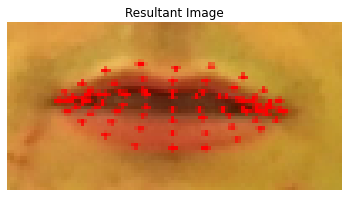

...

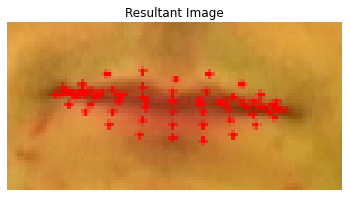

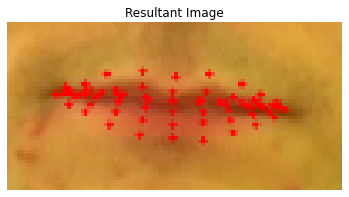

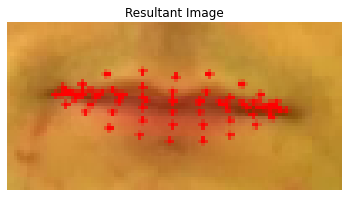

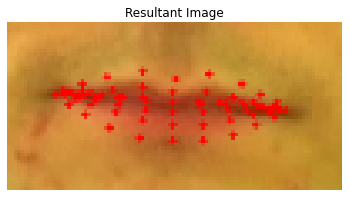

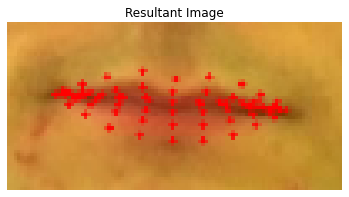

video shape:  (75, 100, 50, 3)
drive/MyDrive/datasets/s3/mpg_6000/lbax8p.mpg


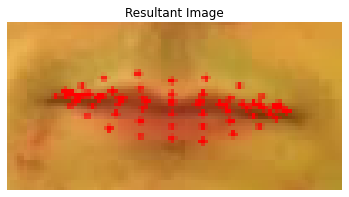

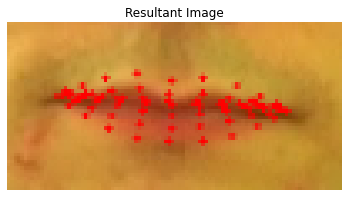

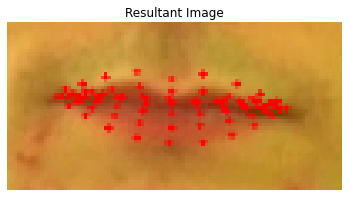

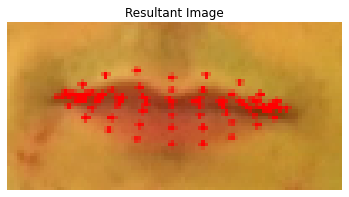

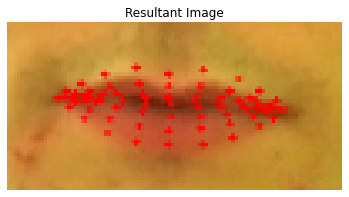

...

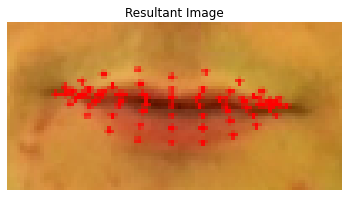

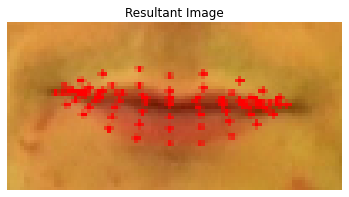

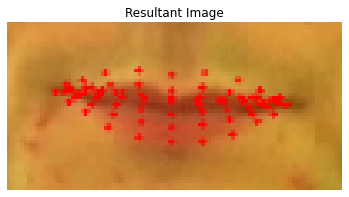

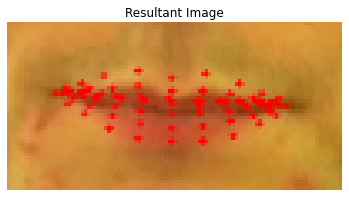

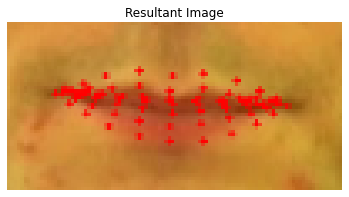

video shape:  (75, 100, 50, 3)
drive/MyDrive/datasets/s3/mpg_6000/lrbl1a.mpg


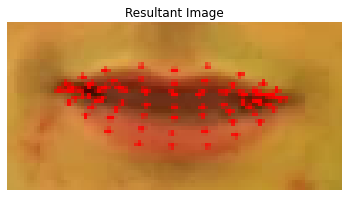

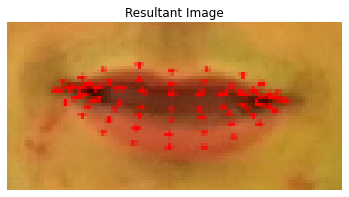

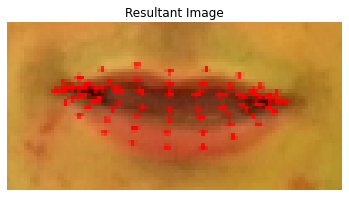

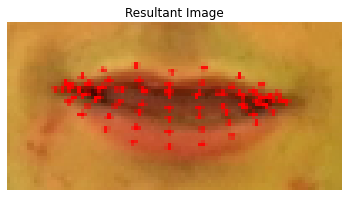

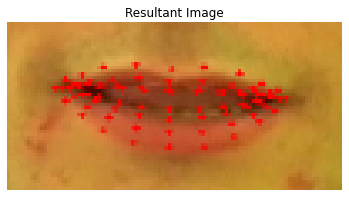

...

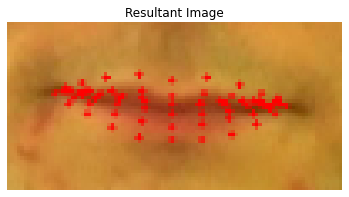

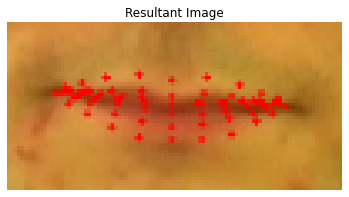

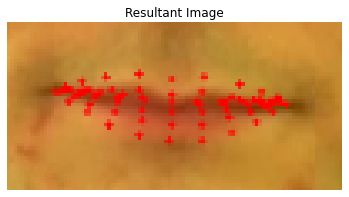

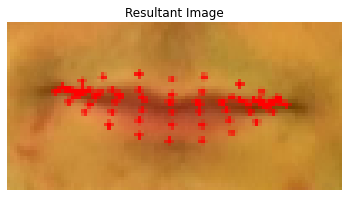

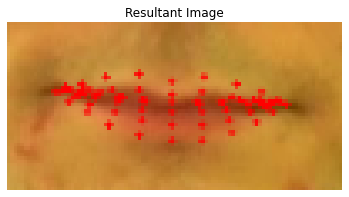

video shape:  (75, 100, 50, 3)
drive/MyDrive/datasets/s3/mpg_6000/swai1a.mpg


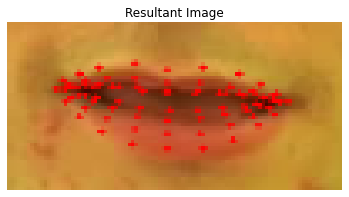

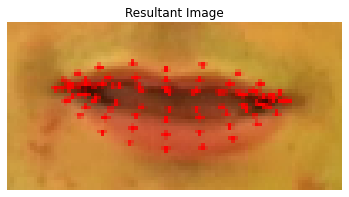

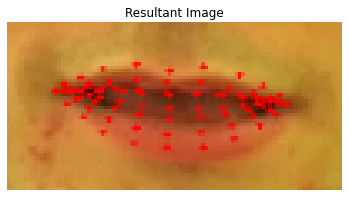

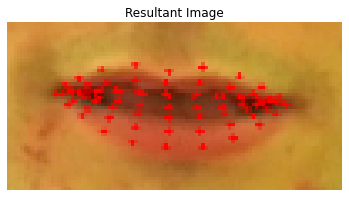

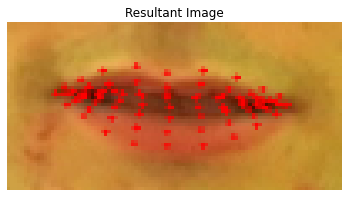

...

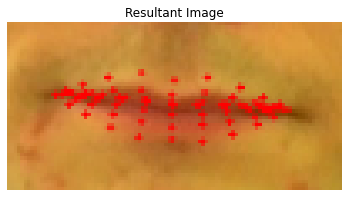

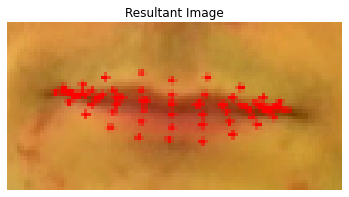

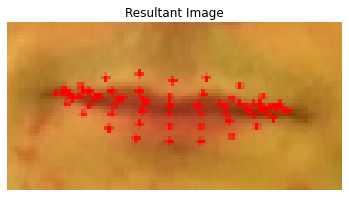

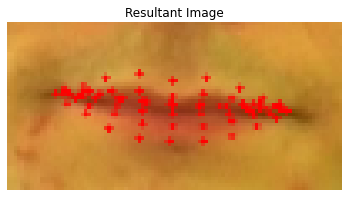

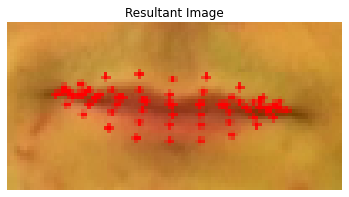

video shape:  (75, 100, 50, 3)
drive/MyDrive/datasets/s3/mpg_6000/srbh9a.mpg


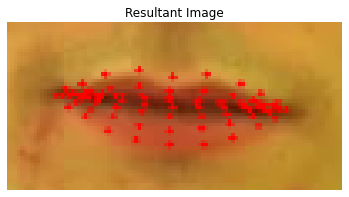

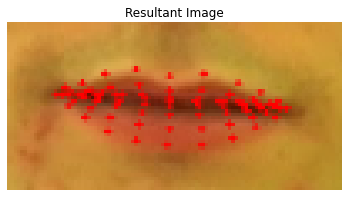

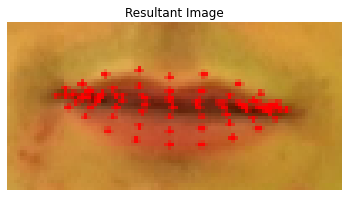

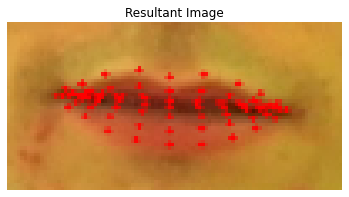

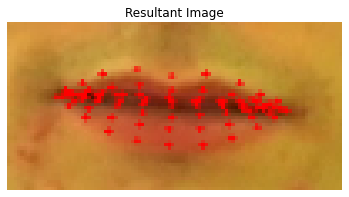

...

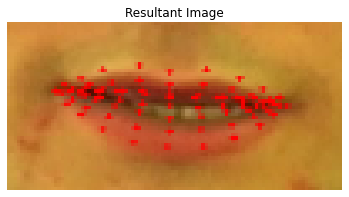

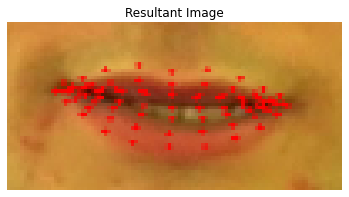

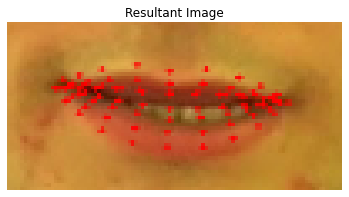

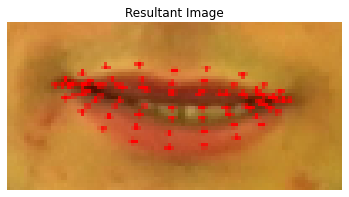

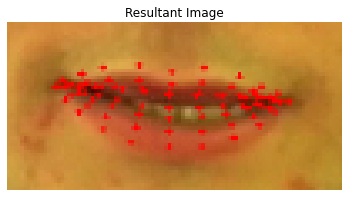

Error loading video: 


TypeError: ignored

In [7]:
CURRENT_PATH = os.path.dirname('drive/MyDrive/datasets/')
DATASET_DIR  = os.path.join(CURRENT_PATH, 's3/mpg_6000/*')
align_path=os.path.join(CURRENT_PATH, 's3/align')
OUTPUT_DIR   = os.path.join(CURRENT_PATH, 'results')
LOG_DIR      = os.path.join(CURRENT_PATH, 'logs')

PREDICT_GREEDY      = False
PREDICT_BEAM_WIDTH  = 200
PREDICT_DICTIONARY  = os.path.join(CURRENT_PATH,'dictionaries','grid.txt')
dataset=datasetMaker(DATASET_DIR,align_path,3,100,50,75,32)
video_list=dataset.enumerate_videos(DATASET_DIR)

In [ ]:
from keras import backend as K
import numpy as np

def _decode(y_pred, input_length, greedy=True, beam_width=100, top_paths=1):
    """Decodes the output of a softmax.
    Can use either greedy search (also known as best path)
    or a constrained dictionary search.
    # Arguments
        y_pred: tensor `(samples, time_steps, num_categories)`
            containing the prediction, or output of the softmax.
        input_length: tensor `(samples, )` containing the sequence length for
            each batch item in `y_pred`.
        greedy: perform much faster best-path search if `true`.
            This does not use a dictionary.
        beam_width: if `greedy` is `false`: a beam search decoder will be used
            with a beam of this width.
        top_paths: if `greedy` is `false`,
            how many of the most probable paths will be returned.
    # Returns
        Tuple:
            List: if `greedy` is `true`, returns a list of one element that
                contains the decoded sequence.
                If `false`, returns the `top_paths` most probable
                decoded sequences.
                Important: blank labels are returned as `-1`.
            Tensor `(top_paths, )` that contains
                the log probability of each decoded sequence.
    """
    decoded = K.ctc_decode(y_pred=y_pred, input_length=input_length,
                           greedy=greedy, beam_width=beam_width, top_paths=top_paths)
    print("decode: ",decoded)
    paths = [path.eval(session=K.get_session()) for path in decoded[0]]
    logprobs  = decoded[1].eval(session=K.get_session())

    return (paths, logprobs)

def decode(y_pred, input_length, greedy=True, beam_width=100, top_paths=1, **kwargs):
    language_model = kwargs.get('language_model', None)

    paths, logprobs = _decode(y_pred=y_pred, input_length=input_length,
                              greedy=greedy, beam_width=beam_width, top_paths=top_paths)
    if language_model is not None:
        # TODO: compute using language model
        raise NotImplementedError("Language model search is not implemented yet")
    else:
        # simply output highest probability sequence
        # paths has been sorted from the start
        result = paths[0]
    return result

class Decoder(object):
    def __init__(self, greedy=True, beam_width=100, top_paths=1, **kwargs):
        self.greedy         = greedy
        self.beam_width     = beam_width
        self.top_paths      = top_paths
        self.language_model = kwargs.get('language_model', None)
        self.postprocessors = kwargs.get('postprocessors', [])

    def decode(self, y_pred, input_length):
        decoded = decode(y_pred, input_length, greedy=self.greedy, beam_width=self.beam_width,
                         top_paths=self.top_paths, language_model=self.language_model)
        preprocessed = []
        for output in decoded:
            out = output
            for postprocessor in self.postprocessors:
                out = postprocessor(out)
            preprocessed.append(out)

        return preprocessed
import re
import string
from collections import Counter

# Source: https://github.com/commonsense/metanl/blob/master/metanl/token_utils.py
def untokenize(words):
    """
    Untokenizing a text undoes the tokenizing operation, restoring
    punctuation and spaces to the places that people expect them to be.
    Ideally, `untokenize(tokenize(text))` should be identical to `text`,
    except for line breaks.
    """
    text = ' '.join(words)
    step1 = text.replace("`` ", '"').replace(" ''", '"').replace('. . .',  '...')
    step2 = step1.replace(" ( ", " (").replace(" ) ", ") ")
    step3 = re.sub(r' ([.,:;?!%]+)([ \'"`])', r"\1\2", step2)
    step4 = re.sub(r' ([.,:;?!%]+)$', r"\1", step3)
    step5 = step4.replace(" '", "'").replace(" n't", "n't").replace(
         "can not", "cannot")
    step6 = step5.replace(" ` ", " '")
    return step6.strip()

# Source: https://stackoverflow.com/questions/367155/splitting-a-string-into-words-and-punctuation
def tokenize(text):
    return re.findall(r"\w+|[^\w\s]", text, re.UNICODE)

# Source: http://norvig.com/spell-correct.html (with some modifications)
class Spell(object):
    def __init__(self, path):
        self.dictionary = Counter(list(string.punctuation) + self.words(open(path).read()))

    def words(self, text):
        return re.findall(r'\w+', text.lower())

    def P(self, word, N=None):
        "Probability of `word`."
        if N is None:
            N = sum(self.dictionary.values())
        return self.dictionary[word] / N

    def correction(self, word):
        "Most probable spelling correction for word."
        return max(self.candidates(word), key=self.P)

    def candidates(self, word):
        "Generate possible spelling corrections for word."
        return (self.known([word]) or self.known(self.edits1(word)) or self.known(self.edits2(word)) or [word])

    def known(self, words):
        "The subset of `words` that appear in the dictionary of WORDS."
        return set(w for w in words if w in self.dictionary)

    def edits1(self, word):
        "All edits that are one edit away from `word`."
        letters    = 'abcdefghijklmnopqrstuvwxyz'
        splits     = [(word[:i], word[i:])    for i in range(len(word) + 1)]
        deletes    = [L + R[1:]               for L, R in splits if R]
        transposes = [L + R[1] + R[0] + R[2:] for L, R in splits if len(R)>1]
        replaces   = [L + c + R[1:]           for L, R in splits if R for c in letters]
        inserts    = [L + c + R               for L, R in splits for c in letters]
        return set(deletes + transposes + replaces + inserts)

    def edits2(self, word):
        "All edits that are two edits away from `word`."
        return (e2 for e1 in self.edits1(word) for e2 in self.edits1(e1))

    # Correct words
    def corrections(self, words):
        return [self.correction(word) for word in words]

    # Correct sentence
    def sentence(self, sentence):
        return untokenize(self.corrections(tokenize(sentence)))

from nltk.translate import bleu_score
import numpy as np
import editdistance
import keras
import csv
import os
import numpy
import doctest

#helpers
def text_to_labels(text):
    ret = []
    for char in text:
        if char >= 'a' and char <= 'z':
            ret.append(ord(char) - ord('a'))
        elif char == ' ':
            ret.append(26)
    return ret

def labels_to_text(labels):
    # 26 is space, 27 is CTC blank char
    text = ''
    for c in labels:
        if c >= 0 and c < 26:
            text += chr(c + ord('a'))
        elif c == 26:
            text += ' '
    return text


In [ ]:
print(video_list)
align_hash=dataset.enumerate_align_hash(video_list)
print(align_hash)

In [ ]:
data=dataset.get_batch(video_list,align_hash)
print(data)

In [ ]:
print(data[0]['the_input'].shape)
print(data[0]['the_labels'].shape)
print(data[0]['input_length'].shape)
print(data[0]['label_length'].shape)

In [ ]:
data[1]['ctc']

In [ ]:
from keras.layers.convolutional import Conv3D, ZeroPadding3D
from keras.layers.pooling import MaxPooling3D
from keras.layers.core import Dense, Activation, SpatialDropout3D, Flatten
from keras.layers import Bidirectional, TimeDistributed
from keras.layers import BatchNormalization
from keras.layers import GRU
from keras.layers import Input
from keras.models import Model
from keras import backend as K
from keras.optimizers import Adam
from keras.layers.core import Lambda
from scipy import ndimage
import numpy as np
import sys
import os

In [ ]:
from keras import backend as K
import numpy as np

def _decode(y_pred, input_length, greedy=True, beam_width=100, top_paths=1):
    """Decodes the output of a softmax.
    Can use either greedy search (also known as best path)
    or a constrained dictionary search.
    # Arguments
        y_pred: tensor `(samples, time_steps, num_categories)`
            containing the prediction, or output of the softmax.
        input_length: tensor `(samples, )` containing the sequence length for
            each batch item in `y_pred`.
        greedy: perform much faster best-path search if `true`.
            This does not use a dictionary.
        beam_width: if `greedy` is `false`: a beam search decoder will be used
            with a beam of this width.
        top_paths: if `greedy` is `false`,
            how many of the most probable paths will be returned.
    # Returns
        Tuple:
            List: if `greedy` is `true`, returns a list of one element that
                contains the decoded sequence.
                If `false`, returns the `top_paths` most probable
                decoded sequences.
                Important: blank labels are returned as `-1`.
            Tensor `(top_paths, )` that contains
                the log probability of each decoded sequence.
    """
    decoded = K.ctc_decode(y_pred=y_pred, input_length=input_length,
                           greedy=greedy, beam_width=beam_width, top_paths=top_paths)
    paths = [path.eval(session=K.get_session()) for path in decoded[0]]
    logprobs  = decoded[1].eval(session=K.get_session())

    return (paths, logprobs)

def decode(y_pred, input_length, greedy=True, beam_width=100, top_paths=1, **kwargs):
    language_model = kwargs.get('language_model', None)

    paths, logprobs = _decode(y_pred=y_pred, input_length=input_length,
                              greedy=greedy, beam_width=beam_width, top_paths=top_paths)
    if language_model is not None:
        # TODO: compute using language model
        raise NotImplementedError("Language model search is not implemented yet")
    else:
        # simply output highest probability sequence
        # paths has been sorted from the start
        result = paths[0]
    return result

class Decoder(object):
    def __init__(self, greedy=True, beam_width=100, top_paths=1, **kwargs):
        self.greedy         = greedy
        self.beam_width     = beam_width
        self.top_paths      = top_paths
        self.language_model = kwargs.get('language_model', None)
        self.postprocessors = kwargs.get('postprocessors', [])

    def decode(self, y_pred, input_length):
        decoded = decode(y_pred, input_length, greedy=self.greedy, beam_width=self.beam_width,
                         top_paths=self.top_paths, language_model=self.language_model)
        preprocessed = []
        for output in decoded:
            out = output
            for postprocessor in self.postprocessors:
                out = postprocessor(out)
            preprocessed.append(out)

        return preprocessed
import re
import string
from collections import Counter

# Source: https://github.com/commonsense/metanl/blob/master/metanl/token_utils.py
def untokenize(words):
    """
    Untokenizing a text undoes the tokenizing operation, restoring
    punctuation and spaces to the places that people expect them to be.
    Ideally, `untokenize(tokenize(text))` should be identical to `text`,
    except for line breaks.
    """
    text = ' '.join(words)
    step1 = text.replace("`` ", '"').replace(" ''", '"').replace('. . .',  '...')
    step2 = step1.replace(" ( ", " (").replace(" ) ", ") ")
    step3 = re.sub(r' ([.,:;?!%]+)([ \'"`])', r"\1\2", step2)
    step4 = re.sub(r' ([.,:;?!%]+)$', r"\1", step3)
    step5 = step4.replace(" '", "'").replace(" n't", "n't").replace(
         "can not", "cannot")
    step6 = step5.replace(" ` ", " '")
    return step6.strip()

# Source: https://stackoverflow.com/questions/367155/splitting-a-string-into-words-and-punctuation
def tokenize(text):
    return re.findall(r"\w+|[^\w\s]", text, re.UNICODE)

# Source: http://norvig.com/spell-correct.html (with some modifications)
class Spell(object):
    def __init__(self, path):
        self.dictionary = Counter(list(string.punctuation) + self.words(open(path).read()))

    def words(self, text):
        return re.findall(r'\w+', text.lower())

    def P(self, word, N=None):
        "Probability of `word`."
        if N is None:
            N = sum(self.dictionary.values())
        return self.dictionary[word] / N

    def correction(self, word):
        "Most probable spelling correction for word."
        return max(self.candidates(word), key=self.P)

    def candidates(self, word):
        "Generate possible spelling corrections for word."
        return (self.known([word]) or self.known(self.edits1(word)) or self.known(self.edits2(word)) or [word])

    def known(self, words):
        "The subset of `words` that appear in the dictionary of WORDS."
        return set(w for w in words if w in self.dictionary)

    def edits1(self, word):
        "All edits that are one edit away from `word`."
        letters    = 'abcdefghijklmnopqrstuvwxyz'
        splits     = [(word[:i], word[i:])    for i in range(len(word) + 1)]
        deletes    = [L + R[1:]               for L, R in splits if R]
        transposes = [L + R[1] + R[0] + R[2:] for L, R in splits if len(R)>1]
        replaces   = [L + c + R[1:]           for L, R in splits if R for c in letters]
        inserts    = [L + c + R               for L, R in splits for c in letters]
        return set(deletes + transposes + replaces + inserts)

    def edits2(self, word):
        "All edits that are two edits away from `word`."
        return (e2 for e1 in self.edits1(word) for e2 in self.edits1(e1))

    # Correct words
    def corrections(self, words):
        return [self.correction(word) for word in words]

    # Correct sentence
    def sentence(self, sentence):
        return untokenize(self.corrections(tokenize(sentence)))

from nltk.translate import bleu_score
import numpy as np
import editdistance
import keras
import csv
import os
import numpy
import doctest

def wer(r, h):
    """
    Source: https://martin-thoma.com/word-error-rate-calculation/
    Calculation of WER with Levenshtein distance.
    Works only for iterables up to 254 elements (uint8).
    O(nm) time ans space complexity.
    Parameters
    ----------
    r : list
    h : list
    Returns
    -------
    int
    Examples
    --------
    >>> wer("who is there".split(), "is there".split())
    1
    >>> wer("who is there".split(), "".split())
    3
    >>> wer("".split(), "who is there".split())
    3
    """
    # initialisation
    d = numpy.zeros((len(r)+1)*(len(h)+1), dtype=numpy.uint8)
    d = d.reshape((len(r)+1, len(h)+1))
    for i in range(len(r)+1):
        for j in range(len(h)+1):
            if i == 0:
                d[0][j] = j
            elif j == 0:
                d[i][0] = i

    # computation
    for i in range(1, len(r)+1):
        for j in range(1, len(h)+1):
            if r[i-1] == h[j-1]:
                d[i][j] = d[i-1][j-1]
            else:
                substitution = d[i-1][j-1] + 1
                insertion    = d[i][j-1] + 1
                deletion     = d[i-1][j] + 1
                d[i][j] = min(substitution, insertion, deletion)

    return d[len(r)][len(h)]

def wer_sentence(r, h):
    return wer(r.split(), h.split())

#if __name__ == "__main__":
#    doctest.testmod()

class Statistics(keras.callbacks.Callback):

    def __init__(self, model_container, generator, decoder, num_samples_stats=256, output_dir=None):
        self.model_container = model_container
        self.output_dir = output_dir
        self.generator = generator
        self.num_samples_stats = num_samples_stats
        self.decoder = decoder
        if output_dir is not None and not os.path.exists(self.output_dir):
            os.makedirs(self.output_dir)

    def get_statistics(self, num):
        num_left = num
        data = []

        while num_left > 0:
            output_batch    = next(self.generator)[0]
            num_proc        = min(output_batch['the_input'].shape[0], num_left)
            y_pred          = self.model_container.predict(output_batch['the_input'][0:num_proc])
            input_length    = output_batch['input_length'][0:num_proc]
            decoded_res     = self.decoder.decode(y_pred, input_length)

            for j in range(0, num_proc):
                data.append((decoded_res[j], output_batch['source_str'][j]))

            num_left -= num_proc

        mean_cer, mean_cer_norm    = self.get_mean_character_error_rate(data)
        mean_wer, mean_wer_norm    = self.get_mean_word_error_rate(data)
        mean_bleu, mean_bleu_norm  = self.get_mean_bleu_score(data)

        return {
            'samples': num,
            'cer': (mean_cer, mean_cer_norm),
            'wer': (mean_wer, mean_wer_norm),
            'bleu': (mean_bleu, mean_bleu_norm)
        }

    def get_mean_tuples(self, data, individual_length, func):
        total       = 0.0
        total_norm  = 0.0
        length      = len(data)
        for i in range(0, length):
            val         = float(func(data[i][0], data[i][1]))
            total      += val
            total_norm += val / individual_length
        return (total/length, total_norm/length)

    def get_mean_character_error_rate(self, data):
        mean_individual_length = np.mean([len(pair[1]) for pair in data])
        return self.get_mean_tuples(data, mean_individual_length, editdistance.eval)

    def get_mean_word_error_rate(self, data):
        mean_individual_length = np.mean([len(pair[1].split()) for pair in data])
        return self.get_mean_tuples(data, mean_individual_length, wer_sentence)

    def get_mean_bleu_score(self, data):
        wrapped_data = [([reference],hypothesis) for reference,hypothesis in data]
        return self.get_mean_tuples(wrapped_data, 1.0, bleu_score.sentence_bleu)

    def on_train_begin(self, logs={}):
        pass
        #with open(os.path.join(self.output_dir, 'stats.csv'), 'w') as csvfile:
         #   print(csvfile)
          #  csvw = csv.writer(csvfile)

           # csvw.writerow(["Epoch", "Samples", "Mean CER", "Mean CER (Norm)", "Mean WER", "Mean WER (Norm)", "Mean BLEU", "Mean BLEU (Norm)"])

    def on_epoch_end(self, epoch, logs={}):
        stats = self.get_statistics(self.num_samples_stats)

        print('\n\n[Epoch %d] Out of %d samples: [CER: %.3f - %.3f] [WER: %.3f - %.3f] [BLEU: %.3f - %.3f]\n'
              % (epoch, stats['samples'], stats['cer'][0], stats['cer'][1], stats['wer'][0], stats['wer'][1], stats['bleu'][0], stats['bleu'][1]))

        #if self.output_dir is not None:
         #   with open(os.path.join(self.output_dir, 'stats.csv'), 'ab') as csvfile:
          #      csvw = csv.writer(csvfile)
           #     csvw.writerow([epoch, stats['samples'],
            #                   "{0:.5f}".format(stats['cer'][0]), "{0:.5f}".format(stats['cer'][1]),
             #                  "{0:.5f}".format(stats['wer'][0]), "{0:.5f}".format(stats['wer'][1]),
              #                 "{0:.5f}".format(stats['bleu'][0]), "{0:.5f}".format(stats['bleu'][1])])


class Visualize(keras.callbacks.Callback):

    def __init__(self, output_dir, model_container, generator, decoder, num_display_sentences=10):
        self.model_container = model_container
        self.output_dir = output_dir
        self.generator = generator
        self.num_display_sentences = num_display_sentences
        self.decoder = decoder
        if not os.path.exists(self.output_dir):
            os.makedirs(self.output_dir)

    def on_epoch_end(self, epoch, logs={}):
        output_batch = next(self.generator)[0]

        y_pred       = self.model_container.predict(output_batch['the_input'][0:self.num_display_sentences])
        input_length = output_batch['input_length'][0:self.num_display_sentences]
        res          = self.decoder.decode(y_pred, input_length)

     #with open(os.path.join(self.output_dir, 'e%02d.csv' % (epoch)), 'wb') as csvfile:
      #      csvw = csv.writer(csvfile)
       #     csvw.writerow(["Truth", "Decoded"])
        #    for i in range(self.num_display_sentences):
         #       csvw.writerow([output_batch['source_str'][i], res[i]])'''
#helpers
def text_to_labels(text):
    ret = []
    for char in text:
        if char >= 'a' and char <= 'z':
            ret.append(ord(char) - ord('a'))
        elif char == ' ':
            ret.append(26)
    return ret

def labels_to_text(labels):
    # 26 is space, 27 is CTC blank char
    text = ''
    for c in labels:
        if c >= 0 and c < 26:
            text += chr(c + ord('a'))
        elif c == 26:
            text += ' '
    return text

from keras import backend as K

# Actual loss calculation
def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    # From Keras example image_ocr.py:
    # the 2 is critical here since the first couple outputs of the RNN
    # tend to be garbage:
    # y_pred = y_pred[:, 2:, :]
    y_pred = y_pred[:, :, :]
    return K.ctc_batch_cost(labels, y_pred, input_length, label_length)

from keras.layers.core import Lambda
from keras.layers import Input

# CTC Layer implementation using Lambda layer
# (because Keras doesn't support extra prams on loss function)
def CTC(name, args):
	return Lambda(ctc_lambda_func, output_shape=(1,), name=name)(args)
 


def build(img_c=3, img_w=100, img_h=50, frames_n=75, absolute_max_string_len=32, output_size=32):
        if K.image_data_format() == 'channels_first':
            input_shape = (img_c, frames_n, img_w, img_h)
        else:
            input_shape = (frames_n, img_w, img_h, img_c)

        input_data = Input(name='the_input', shape=input_shape, dtype='float32')

        zero1 = ZeroPadding3D(padding=(1, 2, 2), name='zero1')(input_data)
        conv1 = Conv3D(32, (3, 5, 5), strides=(1, 2, 2), kernel_initializer='he_normal', name='conv1')(zero1)
        batc1 = BatchNormalization(name='batc1')(conv1)
        actv1 = Activation('relu', name='actv1')(batc1)
        drop1 = SpatialDropout3D(0.5)(actv1)
        maxp1 = MaxPooling3D(pool_size=(1, 2, 2), strides=(1, 2, 2), name='max1')(drop1)

        zero2 = ZeroPadding3D(padding=(1, 2, 2), name='zero2')(maxp1)
        conv2 = Conv3D(64, (3, 5, 5), strides=(1, 1, 1), kernel_initializer='he_normal', name='conv2')(zero2)
        batc2 = BatchNormalization(name='batc2')(conv2)
        actv2 = Activation('relu', name='actv2')(batc2)
        drop2 = SpatialDropout3D(0.5)(actv2)
        maxp2 = MaxPooling3D(pool_size=(1, 2, 2), strides=(1, 2, 2), name='max2')(drop2)

        zero3 = ZeroPadding3D(padding=(1, 1, 1), name='zero3')(maxp2)
        conv3 = Conv3D(96, (3, 3, 3), strides=(1, 1, 1), kernel_initializer='he_normal', name='conv3')(zero3)
        batc3 = BatchNormalization(name='batc3')(conv3)
        actv3 = Activation('relu', name='actv3')(batc3)
        drop3 = SpatialDropout3D(0.5)(actv3)
        maxp3 = MaxPooling3D(pool_size=(1, 2, 2), strides=(1, 2, 2), name='max3')(drop3)

        resh1 = TimeDistributed(Flatten())(maxp3)

        gru_1 = Bidirectional(GRU(256, return_sequences=True,reset_after=False , kernel_initializer='Orthogonal', name='gru1'), merge_mode='concat')(resh1)
        gru_2 = Bidirectional(GRU(256, return_sequences=True,reset_after=False , kernel_initializer='Orthogonal', name='gru2'), merge_mode='concat')(gru_1)

        # transforms RNN output to character activations:
        dense1 = Dense(output_size, kernel_initializer='he_normal', name='dense1')(gru_2)

        y_pred = Activation('softmax', name='softmax')(dense1)
        print("self.y_pred: ",y_pred)

        labels = Input(name='the_labels', shape=[absolute_max_string_len], dtype='float32')
        print("self.y_pred: ",labels)
        input_length = Input(name='input_length', shape=[1], dtype='int64')
        label_length = Input(name='label_length', shape=[1], dtype='int64')

        loss_out = CTC('ctc', [y_pred, labels, input_length, label_length])

        model = Model(inputs=[input_data, labels, input_length, label_length], outputs=loss_out)
        return model

   

In [ ]:

model = build()
print(model.summary())
# plot graph

adam = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-08)

    # the loss calc occurs elsewhere, so use a dummy lambda func for the loss
model.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer=adam)

In [ ]:
his=model.fit(
    x=data[0],
    y=data[1],
    batch_size=1,
    epochs=3,
    initial_epoch=0,
    max_queue_size=10,
    workers=1,
    use_multiprocessing=False,
)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
print(data[1])

In [ ]:
prediction_model = keras.models.Model(
    model.get_layer(name="the_input").input, model.get_layer(name="softmax").output
)
prediction_model.summary()

PREDICT_GREEDY      = False
PREDICT_BEAM_WIDTH  = 200
PREDICT_DICTIONARY  = os.path.join(CURRENT_PATH,'dictionaries','grid.txt')
absolute_max_string_len=32
output_size=32
print ("\nLoading data from disk...")
video_path="drive/MyDrive/datasets/s3/videos/bbaf2p.mpg"
video=Video(vtype="face", face_predictor_path="drive/MyDrive/shape_predictor/predictor.dat").from_video(video_path)

if K.image_data_format() == 'channels_first':
    img_c, frames_n, img_w, img_h = video.data.shape
else:
    print("yes")
    frames_n, img_w, img_h, img_c = video.data.shape
    
print(video.data.shape)
print("frames_n: ",frames_n)
print("img_h: ",img_h)
print("img_w: ",img_w)
print("img_c: ",img_c)
print("absolute_max_string_len: ",absolute_max_string_len)
print("output_size: ",output_size)


spell = Spell(path=PREDICT_DICTIONARY)
decoder = Decoder(greedy=PREDICT_GREEDY, beam_width=PREDICT_BEAM_WIDTH,
                      postprocessors=[labels_to_text, spell.sentence])

X_data       = np.array([video.data]).astype(np.float32) /255
input_length = np.array([len(video.data)])
#print(X_data)
#print(input_length)

y_pred         = prediction_model.predict(X_data)
print(y_pred.shape)
result         = decoder.decode(y_pred, input_length)
print(result)

In [ ]:
result